In [1]:
pip install yfinance

     |████████████████████████████████| 5.5MB 6.2MB/s 
  Created wheel for yfinance: filename=yfinance-0.1.55-py2.py3-none-any.whl size=22618 sha256=036b40ed33bb01eb9d87c9f841ebfb2b5f91e56436c80b80bb4d57d287d9e811
  Stored in directory: /root/.cache/pip/wheels/04/98/cc/2702a4242d60bdc14f48b4557c427ded1fe92aedf257d4565c
Successfully built yfinance
  Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6


In [2]:
pip install pyfolio

     |████████████████████████████████| 92kB 3.7MB/s 
     |████████████████████████████████| 61kB 6.4MB/s 
  Created wheel for pyfolio: filename=pyfolio-0.9.2-cp36-none-any.whl size=88666 sha256=ab52fafa3c091e5c20a65086cc9343ed7efdb980a5ad1268f2853ff341a46743
  Stored in directory: /root/.cache/pip/wheels/0d/a8/7d/ac33fe6bf6f3db370291c9de303460d00b8f97cc40a1d80f72
  Created wheel for empyrical: filename=empyrical-0.5.5-cp36-none-any.whl size=39763 sha256=34486df9f9e811fe04c4f2027140c41298f3a22f80d69b922fb925c147aca1a2
  Stored in directory: /root/.cache/pip/wheels/ea/b2/c8/6769d8444d2f2e608fae2641833110668d0ffd1abeb2e9f3fc
Successfully built pyfolio empyrical


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
import scipy.optimize as sco
#Getting data from yfinance
import yfinance as yf
import pandas as pd
import numpy as np
import pyfolio as pf
plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

/usr/local/lib/python3.6/dist-packages/pyfolio/pos.py:28: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  ' to position notionals.'




1.   **Sharpe Ratio:** Measures excess return per unit of std. Greater sharpe ratio better risk adjusted
2.   **Max-Drawdown:** Measures downside risk. Lower is better!!
3.   **Clamar Ratio:** Higher ratio is better
4.   **Tail Ratio:** eg A ratio of 0.8 means losses are 1.25 times as bad as profit



In [5]:

RISKY_ASSETS= ['AAPL','IBM','MSFT','TWTR']
START_DATE= '2012-01-01'
n_assets= len(RISKY_ASSETS)
price_df= yf.download(RISKY_ASSETS,start=START_DATE,adjusted=True)
returns= price_df['Adj Close'].pct_change().dropna()
portfolio_weigths= n_assets * [1/n_assets]
portfolio_returns= pd.Series(np.dot(portfolio_weigths,returns.T), index= returns.index)
pf.create_simple_tear_sheet(portfolio_returns)

[*********************100%***********************]  4 of 4 completed


Start date,2013-11-08
End date,2020-11-25
Total months,84
,Backtest
Annual return,18.3%
Cumulative returns,227.3%
Annual volatility,25.0%
Sharpe ratio,0.80
Calmar ratio,0.51
Stability,0.81
Max drawdown,-35.9%


In [6]:
price_df

Adj Close                          ...   Volume                      
                  AAPL         IBM        MSFT  ...      IBM      MSFT        TWTR
Date                                            ...                               
2012-01-03   12.566676  134.349426   21.849474  ...  5646000  64731500         NaN
2012-01-04   12.634213  133.801376   22.363672  ...  4346700  80516100         NaN
2012-01-05   12.774481  133.166763   22.592201  ...  4463100  56081400         NaN
2012-01-06   12.908023  131.637955   22.943169  ...  4897100  99455500         NaN
2012-01-09   12.887549  130.952866   22.641172  ...  5201200  59706800         NaN
...                ...         ...         ...  ...      ...       ...         ...
2020-11-19  118.639999  117.180000  212.419998  ...  3439600  24792700  13874000.0
2020-11-20  117.339996  116.940002  210.389999  ...  5024300  22829100  17045500.0
2020-11-23  113.849998  120.089996  210.110001  ...  5650400  25683500  10392100.0
2020-11-24  115.169998  124.419998  213.860001  ...  7752500  33979700   9053900.0
2020-11-25  116.029999  124.199997  213.869995  ...  4135400  20987900  15073400.0

[2241 rows x 24 columns]

In [7]:
N_PORTFOLIOS= 10 ** 5
N_DAYS = 252
returns_df= price_df['Adj Close'].pct_change().dropna()
avg_returns = returns_df.mean() * N_DAYS
cov_mat = returns_df.cov() * N_DAYS
#RANDOM WEIGHTS
np.random.seed(42)
weights= np.random.random(size=(N_PORTFOLIOS,n_assets))
weights /= np.sum(weights,axis=1)[:,np.newaxis]
#calculate portfolio metrics
portf_rtns= np.dot(weights,avg_returns)
portf_vol=[]
for i in range(0, len(weights)):
  portf_vol.append(np.sqrt(np.dot(weights[i].T,
                           np.dot(cov_mat,weights[i]))))
portf_vol=np.array(portf_vol)
portf_sharpe_ratio= portf_rtns/portf_vol
portf_results_df= pd.DataFrame({'returns': portf_rtns,
                        'volatility': portf_vol,
                        'sharpe_ratio': portf_sharpe_ratio})
portf_results_df

,returns,volatility,sharpe_ratio
0,0.170770,0.240327,0.710573
1,0.166709,0.410218,0.406391
2,0.157966,0.298122,0.529870
3,0.251419,0.246437,1.020216
4,0.182928,0.233585,0.783132
...,...,...,...
99995,0.151554,0.219029,0.691936
99996,0.207408,0.333939,0.621096
99997,0.200007,0.219691,0.910402
99998,0.221751,0.265747,0.834444


#Monte Carlo Simulation

In [8]:
N_POINTS = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                            N_POINTS)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(N_POINTS):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

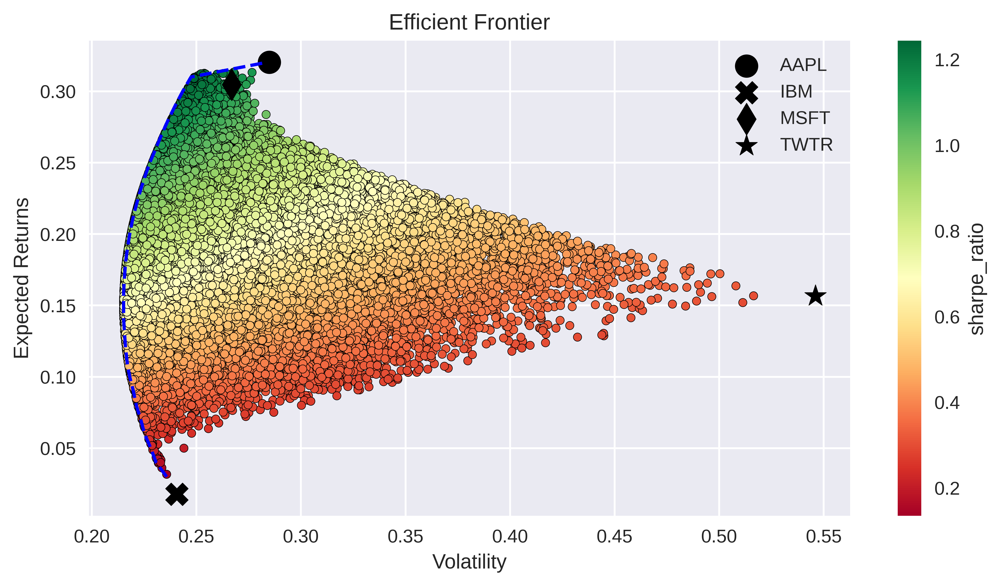

In [9]:
MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=RISKY_ASSETS[asset_index])
ax.legend()

plt.tight_layout()
plt.savefig('/plot1.png')
plt.show()

In [10]:
max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
max_sharpe_portf = portf_results_df.loc[max_sharpe_ind]

min_vol_ind = np.argmin(portf_results_df.volatility)
min_vol_portf = portf_results_df.loc[min_vol_ind]
print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(RISKY_ASSETS, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Maximum Sharpe Ratio portfolio
Performance
returns: 30.98% volatility: 24.90% sharpe_ratio: 124.40% 
Weights
AAPL: 45.91% IBM: 0.57% MSFT: 53.25% TWTR: 0.27% 

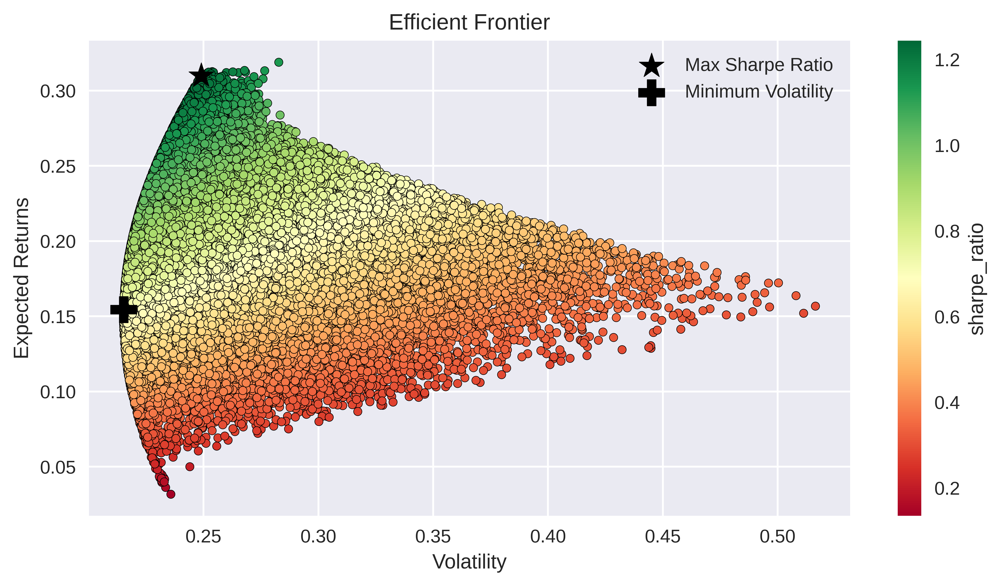

In [11]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()
plt.savefig('plot2.png')
plt.show()

In [12]:
print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(RISKY_ASSETS, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Maximum Sharpe Ratio portfolio
Performance
returns: 30.98% volatility: 24.90% sharpe_ratio: 124.40% 
Weights
AAPL: 45.91% IBM: 0.57% MSFT: 53.25% TWTR: 0.27% 

In [13]:
print('Minimum Volatility portfolio')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(RISKY_ASSETS, weights[np.argmin(portf_results_df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio
Performance
returns: 15.45% volatility: 21.52% sharpe_ratio: 71.80% 
Weights
AAPL: 22.37% IBM: 52.19% MSFT: 22.81% TWTR: 2.63% 

#Scipy optimization method

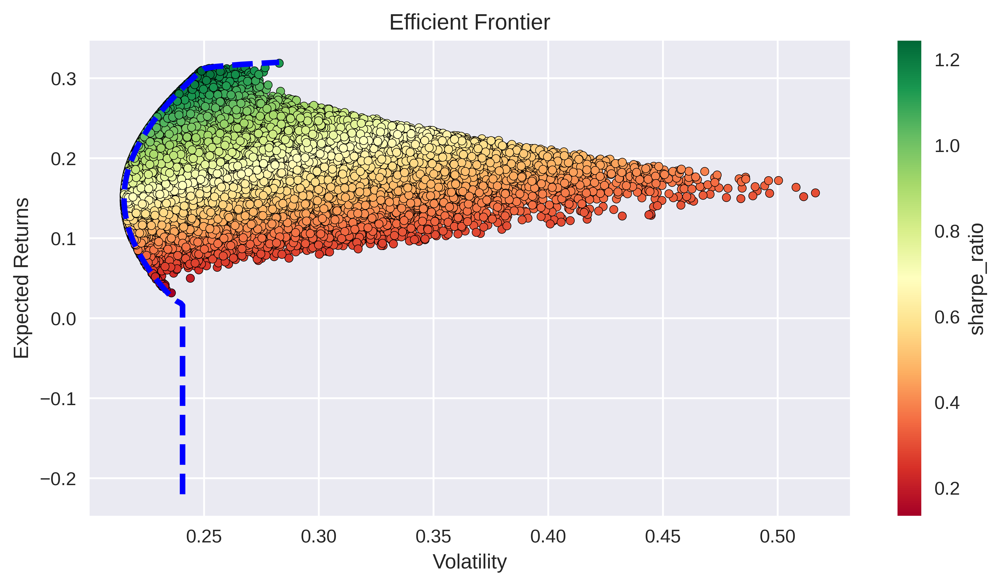

In [14]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios
rtns_range = np.linspace(-0.22, 0.32, 200)
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)
vols_range = [x['fun'] for x in efficient_portfolios]
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.plot(vols_range, rtns_range, 'b--', linewidth=3)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')

plt.tight_layout()
plt.savefig('plot3.png')
plt.show()

In [15]:
min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}
print('Minimum Volatility portfolio')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(RISKY_ASSETS, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio
Performance
Return: 14.90% Volatility: 21.52% Sharpe Ratio: 69.27% 
Weights
AAPL: 20.92% IBM: 54.00% MSFT: 22.43% TWTR: 2.66% 

In [16]:
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio
n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}
print('Maximum Sharpe Ratio portfolio')
print('Performance')

for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(RISKY_ASSETS, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Maximum Sharpe Ratio portfolio
Performance
Return: 31.19% Volatility: 24.98% Sharpe Ratio: 124.84% 
Weights
AAPL: 46.60% IBM: 0.00% MSFT: 53.40% TWTR: 0.00% 

In [72]:
from tensorflow import keras
from sklearn import metrics

def regression_eval(y_true,y_pred):
    variance_score= metrics.explained_variance_score(y_true, y_pred)
    mse= np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    r2= metrics.r2_score(y_true, y_pred)
    return print(f'Varianace score (Best possible score is 1.0, lower values are worse.) : {variance_score}\nrmse : {mse}\nR2 (Best possible score is 1.0): {r2}')
def get_closevol(df, AddTicker):
  new_df=pd.DataFrame({'Close':df['Close'][AddTicker],'Volume': df['Volume'][AddTicker]})
  return new_df
def trading_window(df):
  n=1 #shift price by 1 day
  df['Target']= df[['Close']].shift(-n)
  return df
from sklearn.preprocessing import MinMaxScaler
df=get_closevol(price_df,'MSFT')
df=trading_window(df)
Date=pd.DataFrame({'Date':df.index})
df = df[:-1]
sc = MinMaxScaler(feature_range= (0,1))
training_set_scaled = sc.fit_transform(df)

# Create the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])
# Convert the data into array format
X = np.asarray(X)
y = np.asarray(y)
# Split the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]
# Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
# Create the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
# Train the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)
# Make prediction
test_prediction= model.predict(X_test)
regression_eval(y_test , test_prediction)

Epoch 1/20
40/40 [==============================] - 2s 40ms/step - loss: 0.0031 - val_loss: 0.0294
Epoch 2/20
40/40 [==============================] - 0s 11ms/step - loss: 0.0018 - val_loss: 0.0074
Epoch 3/20
40/40 [==============================] - 0s 11ms/step - loss: 1.7866e-04 - val_loss: 9.7300e-05
Epoch 4/20
40/40 [==============================] - 0s 11ms/step - loss: 4.4752e-05 - val_loss: 2.4218e-05
Epoch 5/20
40/40 [==============================] - 0s 11ms/step - loss: 3.5090e-05 - val_loss: 4.3358e-05
Epoch 6/20
40/40 [==============================] - 0s 11ms/step - loss: 3.3414e-05 - val_loss: 8.1222e-05
Epoch 7/20
40/40 [==============================] - 0s 11ms/step - loss: 3.7183e-05 - val_loss: 6.5206e-05
Epoch 8/20
40/40 [==============================] - 0s 11ms/step - loss: 4.0419e-05 - val_loss: 3.6224e-05
Epoch 9/20
40/40 [==============================] - 0s 11ms/step - loss: 3.3951e-05 - val_loss: 2.4934e-05
Epoch 10/20
40/40 [==============================] - 